# Денойзинг. DnCNN

**Датасет**

Я взял Стенфордский датасет с собачками. Изначально он подразумевался для классификации пород, но нам это не так важно

In [ ]:
!wget http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
!tar -xvf images.tar
!mkdir dataset_dogs

In [ ]:
import os
import shutil
from PIL import Image
path = 'Images'
directory = os.fsencode(path)

for file in os.listdir(directory):
    dirname = path + os.sep + str(os.fsdecode(file))
    for photo in os.listdir(os.fsencode(dirname)):
        pname = os.fsdecode(photo)
        full_path = dirname + os.sep + pname
        shutil.copyfile(full_path, 'dataset_dogs' + os.sep + pname) 

In [1]:
#!g1.1
import os
from PIL import Image
import numpy as np

path = 'dataset_dogs'
dirname = os.fsencode(path)

noisy_images = []
clean_images = []

for photo in os.listdir(os.fsencode(dirname)):
    pname = os.fsdecode(photo)
    full_path = path + os.sep + pname
    img = Image.open(full_path)
    clean_images.append(img)

In [2]:
#!g1.1
import torch
import torch.nn as nn
device = 'cuda'

**Модель**

Я построил модель DnCNN, как она описана в статье Beyond a Gaussian Denoiser: Residual Learning of
Deep CNN for Image Denoising (https://arxiv.org/abs/1608.03981)

In [3]:
#!g1.1
from torch.nn.modules.batchnorm import BatchNorm2d
class DnCNN(nn.Module):
    def __init__(self, d=5):
        super().__init__()
        self.d = d
        self.enter = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding=1),
            nn.ReLU()
        )
        self.core = []
        for i in range(d):
            self.core.append(nn.Conv2d(64, 64, 3, padding=1))
            self.core.append(nn.BatchNorm2d(64))
            self.core.append(nn.ReLU())
        self.out = nn.Conv2d(64, 3, 3, padding=1)
        self.model = nn.Sequential(self.enter, *self.core, self.out)
  
    def forward(self, x):
        return self.model(x)

Обучаю патчами по 100х100

In [4]:
#!g1.1
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

tr = transforms.Compose([
  transforms.ToTensor(),
  transforms.RandomCrop(100),
  transforms.Normalize((0.5, 0.5, 0.5),
                      (0.5, 0.5, 0.5)),]
)

tr_eval = transforms.Compose([
  transforms.ToTensor(),
  transforms.Normalize((0.5, 0.5, 0.5),
                      (0.5, 0.5, 0.5)),
])

class MyDataset(Dataset):
    def __init__(self, trans, clean):
        self.trans = trans
        self.clean = clean
    def __len__(self):
        return len(self.clean)
    def __getitem__(self, idx):
        return self.trans(self.clean[idx])

Авторы статьи отмечали, что не использовали стандартные инициализации Хавьера, а действовали в соответствие со статьей Delving Deep into Rectifiers:
Surpassing Human-Level Performance on ImageNet Classification (https://arxiv.org/abs/1502.01852). Я тоже сделал такую

In [5]:
def init_kaiming(layer):
    if isinstance(layer, nn.Conv2d):
        nn.init.kaiming_normal_(layer.weight, mode='fan_in')
    elif isinstance(layer, nn.BatchNorm2d):
        layer.bias.data.fill_(0.0)
        nn.init.normal_(layer.weight, 0, 0.01)
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

Для меня самая интересная часть была в настройках оптимизатора и параметров обучения, потому что авторы статьи предлагают обучать SGD 50 эпох со снижающимся LR, но у меня, как я ни пытался, не получилось с помощью SGD побить Adam, поэтому я протестировал обучение с разными оптимизаторами и сравнил траекторию лосса и метрики psnr. Размер батча 128 как в статье у меня не влез на ГПУ, поэтому я использовал 64.

In [ ]:
!pip install --upgrade torchmetrics

In [6]:
from IPython.display import clear_output
from torch.optim import SGD, Adam
from torch.optim.lr_scheduler import StepLR, OneCycleLR
from tqdm import tqdm, trange
import matplotlib.pyplot as plt
import torchmetrics.functional as tmf

sigma = 35
dataset = MyDataset(tr, clean_images[:400])
loader = DataLoader(dataset, batch_size=64, shuffle=True)

def run_training(opt, lr, sched=None, epochs=50):
    net = DnCNN(20).to(device)
    net.apply(init_kaiming)
    if opt == 'adam':
        optimizer = Adam(net.parameters(), lr=lr)
    else:
        optimizer = SGD(net.parameters(), lr=lr, weight_decay=0.0001, momentum=0.9)
    if sched == 'step':
        scheduler = StepLR(optimizer, step_size=50, gamma=0.75)
    elif sched == 'cycle':
        scheduler = OneCycleLR(optimizer, max_lr=0.2, total_steps=400*epochs)
    loss_hist = []
    psnr_hist = []
    torch.cuda.empty_cache()
    for epoch in trange(epochs):
        for clean in loader:
            if clean.shape[1] != 3:
                continue
            noise = torch.FloatTensor(clean.shape).normal_(0, std=sigma / 255)
            noisy = clean + noise
            optimizer.zero_grad()
            n = noisy.to(device)
            c = clean.to(device)
            predicted_noise = net(n)
            loss = nn.MSELoss()(noise.to(device), predicted_noise)
            loss_hist.append(loss.item())
            psnr = sum([tmf.peak_signal_noise_ratio((n - predicted_noise)[i], c[i]) for i in range(clean.shape[0])])
            psnr_hist.append(psnr)
            
            loss.backward()
            optimizer.step()
            if sched:
                scheduler.step()
    psnr_hist = [a.item() for a in psnr_hist]
    return loss_hist, psnr_hist

In [7]:
results = dict()
results['Adam_001_nosched'] = run_training('adam', 0.001)
results['Adam_02_nosched'] = run_training('adam', 0.02)
results['Adam_001_steplr'] = run_training('adam', 0.001, sched='step')
results['Adam_02_onecycle'] = run_training('adam', 0.02, sched='cycle')

100%|██████████| 50/50 [02:36<00:00,  3.13s/it]


Для начала посмотрим лосс (меньше - лучше):

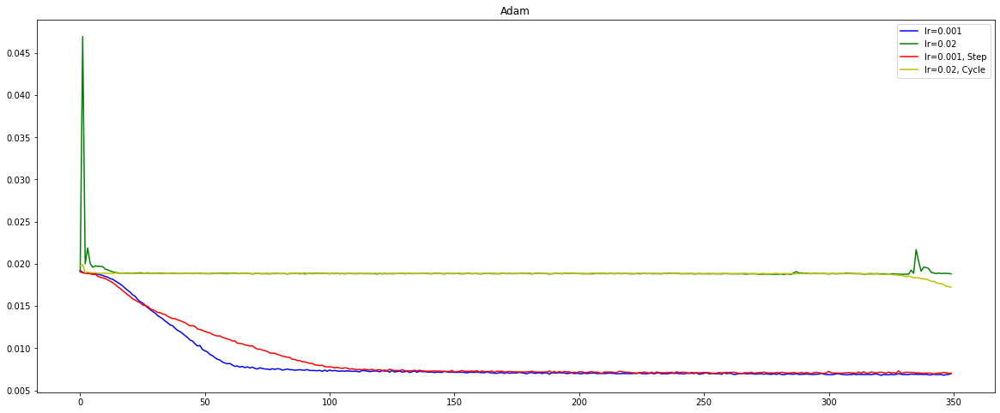

In [16]:
plt.figure(figsize=(20, 8))
plt.plot(results['Adam_001_nosched'][0], c='b', label='lr=0.001')
plt.plot(results['Adam_02_nosched'][0], c='g', label='lr=0.02')
plt.plot(results['Adam_001_steplr'][0], c='r', label='lr=0.001, Step')
plt.plot(results['Adam_02_onecycle'][0], c='y', label='lr=0.02, Cycle')
plt.legend()
plt.title('Adam')
plt.show()

PSNR (больше - лучше)

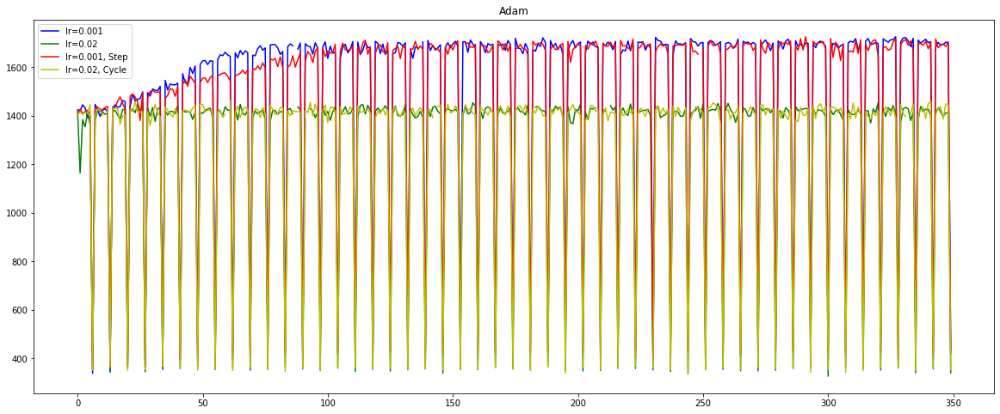

In [17]:
plt.figure(figsize=(20, 8))
plt.plot(results['Adam_001_nosched'][1], c='b', label='lr=0.001')
plt.plot(results['Adam_02_nosched'][1], c='g', label='lr=0.02')
plt.plot(results['Adam_001_steplr'][1], c='r', label='lr=0.001, Step')
plt.plot(results['Adam_02_onecycle'][1], c='y', label='lr=0.02, Cycle')
plt.legend()
plt.title('Adam')
plt.show()

И теперь то же самое для СГД

In [18]:
results['SGD_01_nosched'] = run_training('sgd', 0.01)
results['SGD_02_nosched'] = run_training('sgd', 0.2)
results['SGD_001_steplr'] = run_training('sgd', 0.01, sched='step')
results['SGD_02_onecycle'] = run_training('sgd', 0.2, sched='cycle')

  2%|▏         | 1/50 [00:04<03:46,  4.62s/it]


KeyboardInterrupt: 

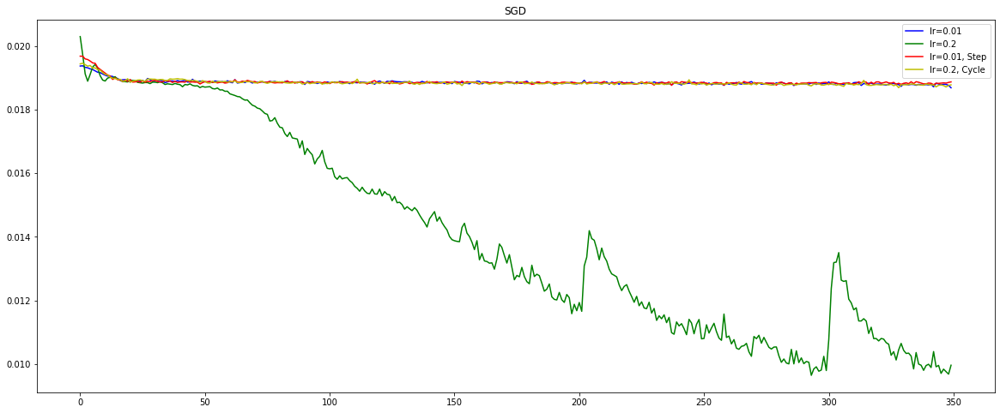

In [19]:
plt.figure(figsize=(20, 8))
plt.plot(results['SGD_01_nosched'][0], c='b', label='lr=0.01')
plt.plot(results['SGD_02_nosched'][0], c='g', label='lr=0.2')
plt.plot(results['SGD_001_steplr'][0], c='r', label='lr=0.01, Step')
plt.plot(results['SGD_02_onecycle'][0], c='y', label='lr=0.2, Cycle')
plt.legend()
plt.title('SGD')
plt.show()

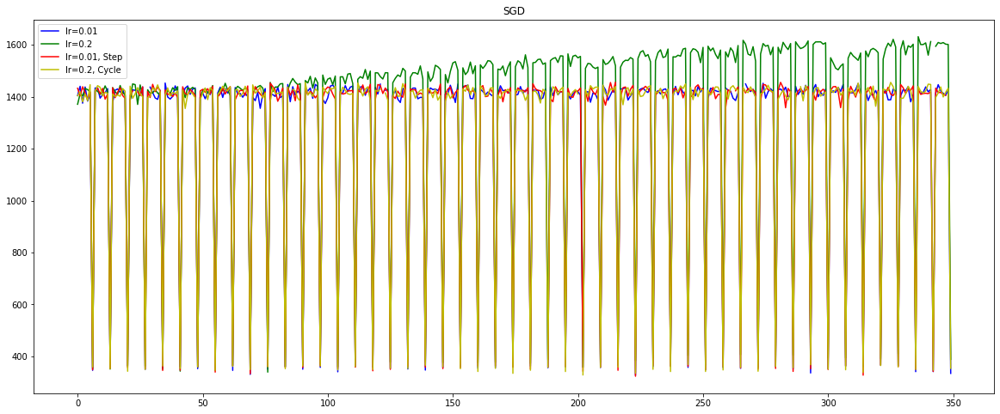

In [20]:
plt.figure(figsize=(20, 8))
plt.plot(results['SGD_01_nosched'][1], c='b', label='lr=0.01')
plt.plot(results['SGD_02_nosched'][1], c='g', label='lr=0.2')
plt.plot(results['SGD_001_steplr'][1], c='r', label='lr=0.01, Step')
plt.plot(results['SGD_02_onecycle'][1], c='y', label='lr=0.2, Cycle')
plt.legend()
plt.title('SGD')
plt.show()

А теперь сравним лучших:

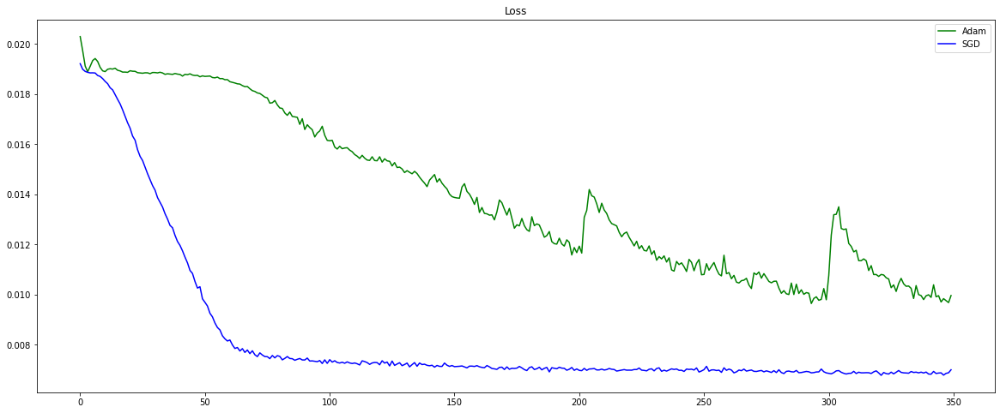

In [22]:
plt.figure(figsize=(20, 8))
plt.plot(results['SGD_02_nosched'][0], c='g', label='Adam')
plt.plot(results['Adam_001_nosched'][0], c='b', label='SGD')
plt.legend()
plt.title('Loss')
plt.show()

Как я уже упоминал выше, Адам сходится намного быстрее, так что берем этот вариант, обучаем и смотрим на картиночки!

Epoch: 49 lr: 0.001


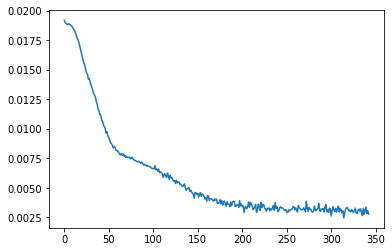

100%|██████████| 7/7 [00:03<00:00,  2.23it/s]


In [24]:
#!g1.1
sigma = 35

net = DnCNN(20).to(device)
net.apply(init_kaiming)
dataset = MyDataset(tr, clean_images[:400])
optimizer = Adam(net.parameters(), lr=0.001)

n_epochs = 50
loss_hist = []

loader = DataLoader(dataset, batch_size=64, shuffle=True)

net.train()
for epoch in range(n_epochs):
    clear_output(wait=True)
    print('Epoch:', epoch, 'lr:', get_lr(optimizer))
    plt.plot(loss_hist)
    plt.show()
    for clean in tqdm(loader):
        if clean.shape[1] != 3:
            continue
        noise =  torch.FloatTensor(clean.shape).normal_(0, std=sigma / 255)
        noisy = clean + noise
        optimizer.zero_grad()
        n = noisy.to(device)
        c = clean.to(device)
        predicted_noise = net(n)
        loss = nn.MSELoss()(noise.to(device), predicted_noise)
        loss_hist.append(loss.item())
        loss.backward()
        optimizer.step()

In [ ]:
plt.plot(loss_hist)
plt.show()

Теперь посмотрим резултаты на тестовой выборке

In [25]:
dataset_eval = MyDataset(tr_eval, clean_images[500: 1000])

r_tr = transforms.Compose([
    transforms.Normalize(0, 2),
    transforms.Normalize(-0.5, 1),
    transforms.ToPILImage()
])
def get_concat_h(im1, im2): # Взял https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

def compare(clean, model):
    noise =  torch.FloatTensor(clean.shape).normal_(0, std=sigma / 255)
    noisy = (clean + noise).to(device)
    predicted_noise = model(noisy.unsqueeze(0).to(device))[0]
    predicted_clean = noisy - predicted_noise
    return clean, noisy, predicted_clean, predicted_noise

def get_panel(clean, model):
    c, n, p, ns = compare(clean, model)
    clean_img = r_tr(torch.clamp(c, -1, 1))# Image.fromarray((c.detach().cpu().numpy().transpose((1, 2, 0)) * 127.5 + 127.5).astype(np.uint8))
    noisy_img = r_tr(torch.clamp(n, -1, 1))# Image.fromarray((n.detach().cpu().numpy().transpose((1, 2, 0)) * 127.5 + 127.5).astype(np.uint8))
    predc_img = r_tr(torch.clamp(p, -1, 1))# Image.fromarray((p.detach().cpu().numpy().transpose((1, 2, 0)) * 127.5 + 127.5).astype(np.uint8))
    ns_img = r_tr(torch.clamp(ns, -1, 1))
    return get_concat_h(clean_img, get_concat_h(noisy_img, get_concat_h(predc_img, ns_img)))

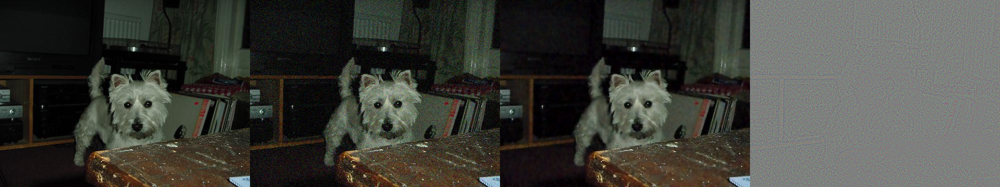

In [27]:
net.eval()
get_panel(dataset_eval[0], net)

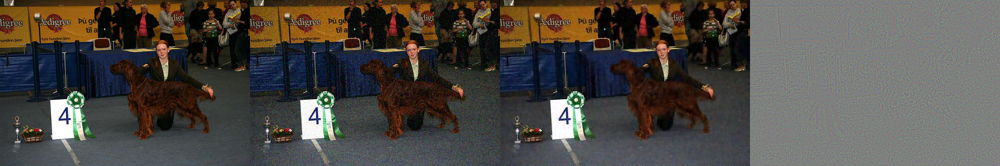

In [28]:
get_panel(dataset_eval[1], net)

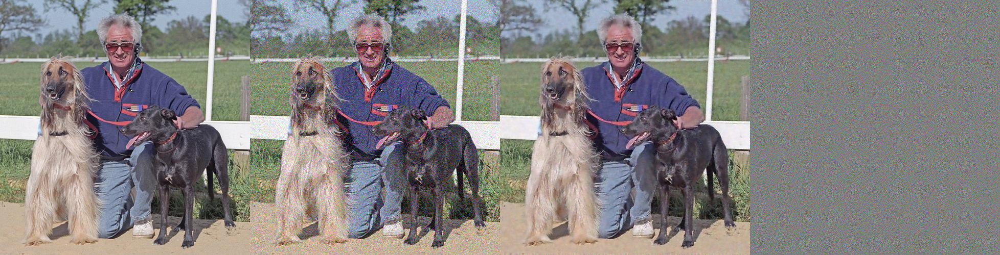

In [29]:
get_panel(dataset_eval[2], net)

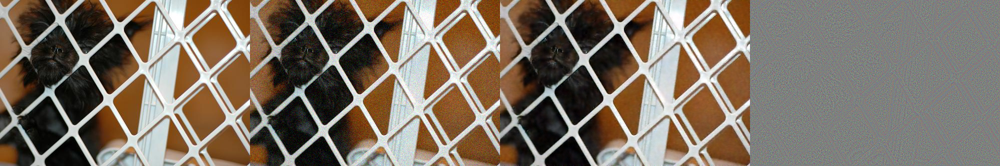

In [30]:
get_panel(dataset_eval[3], net)

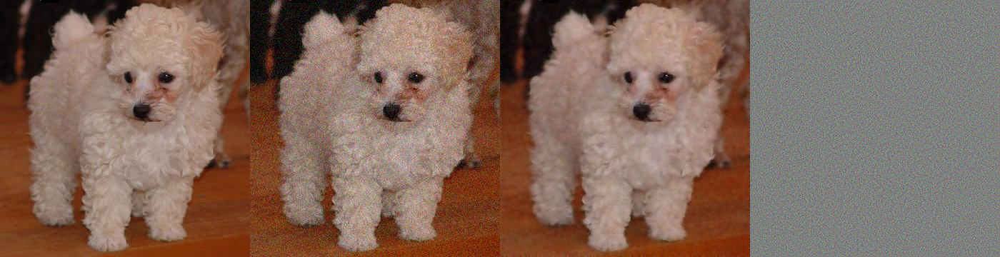

In [31]:
get_panel(dataset_eval[4], net)

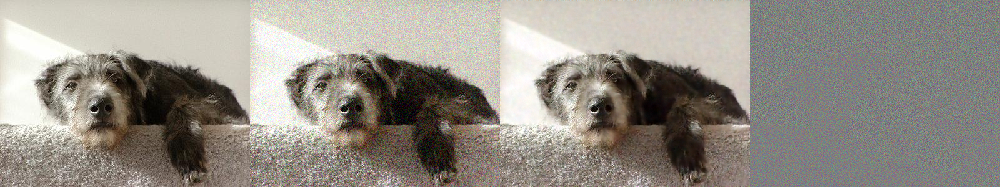

In [32]:
get_panel(dataset_eval[5], net)